# Image Generation with Fine-tuned Amazon Titan Image Generator G1 model

> ☝️ This notebook has been tested with the **`SageMaker Data Science 3.0`** kernel in Amazon SageMaker Studio.

---

In this notebook, we will show how to invoke a fine-tuned [Amazon Titan Image Generator G1](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-image-models.html) on [Amazon Bedrock](https://aws.amazon.com/bedrock/) trained with Ron the dog and Smila the cat

<img src="data/smila_ft_1.png" width="25%" height="25%" style="float: left"/>
<img src="data/smila_ft_2.png" width="25%" height="25%" style="float: left" />
<img src="data/ron_ft_1.png" width="25%" height="25%" style="float: left" />
<img src="data/ron_ft_2.png" width="25%" height="25%" style="float: left" />

## Pre-requisites

Import needed libraries, instantiate the boto3 clients and setup any style tag that was added during model fine-tuning

In [2]:
import boto3
import io
import json
import base64
import numpy as np
from PIL import Image
from ipywidgets import Dropdown
import matplotlib.pyplot as plt

bedrock = boto3.client('bedrock')
bedrock_runtime = boto3.client('bedrock-runtime')

## Select Customization Job

Next, let's select the customization job from a dropdown list. The selection list includes only successfully completed fine-tuning jobs. To help you select the correct job, we are adding the creationTime information

In [3]:
customization_jobs = {}
dropdown_vals = []
for cj in bedrock.list_model_customization_jobs()["modelCustomizationJobSummaries"]:
    if cj["status"] == "Completed":
        customization_jobs[cj["customModelName"]] = cj
        dropdown_vals.append(cj["customModelName"] + " - creationTime: " + cj["creationTime"].strftime("%Y-%m-%d %H:%M:%S"))

# display the model-ids in a dropdown to select a model for inference.
model_dropdown = Dropdown(
    options=dropdown_vals,
    value=dropdown_vals[0],
    description="Select a model",
    style={"description_width": "initial"},
    layout={"width": "max-content"},
)
display(model_dropdown)

Dropdown(description='Select a model', layout=Layout(width='max-content'), options=('image-gen-ft-2024-07-12-1…

In [4]:
selected_model = model_dropdown.value.split(" - creationTime: ")[0]
custom_model_name, custom_model_arn = selected_model, customization_jobs[selected_model]["customModelArn"]
custom_model_name, custom_model_arn

('image-gen-ft-2024-07-12-13-43-03',
 'arn:aws:bedrock:us-east-1:094784590684:custom-model/amazon.titan-image-generator-v1:0/3uoq4ebumu07')

## Create Provisioned Model Throughput
<div class=\"alert alert-block alert-info\">
    <b>Note:</b> Creating provisioned throughput will take around 20-30mins to complete.
</div>


You will need to create provisioned throughput to be able to evaluate the model performance. You can do so through the [console](https://docs.aws.amazon.com/bedrock/latest/userguide/prov-cap-console.html) or use the following api call. 

In [5]:
# Create the provision throughput job and retrieve the provisioned model id
provisioned_model_id = bedrock.create_provisioned_model_throughput(
    modelUnits=1,
    # create a name for your provisioned throughput model
    provisionedModelName=custom_model_name, 
    modelId=custom_model_arn
)['provisionedModelArn']

In [6]:
%%time
# check provisioned throughput job status
import time
status_provisioning = bedrock.get_provisioned_model_throughput(provisionedModelId = provisioned_model_id)['status'] 
while status_provisioning == 'Creating':
    time.sleep(60)
    status_provisioning = bedrock.get_provisioned_model_throughput(provisionedModelId=provisioned_model_id)['status']
    print(status_provisioning)

Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
Creating
InService
CPU times: user 73.7 ms, sys: 15.4 ms, total: 89.1 ms
Wall time: 16min 3s


In [7]:
provisioned_model_id

'arn:aws:bedrock:us-east-1:094784590684:provisioned-model/b39nwym5zcrn'

## Running model invocation experiments

We will now run some model experiments using the `bedrock-runtime` client with the `invoke_model` function to invoke both fine-tuned and pre-trained models. 

To invoke the provisioned custom model, notice you will need to run the previous step (create provisioned throughput) before proceeding.

In [8]:
prompts = [
    "Ron the dog in the snow.",
    "Smila the cat in the snow.",
]
seeds = [0, 3000]

In [9]:
def decode_base64_image(img_b64):
    return Image.open(io.BytesIO(base64.b64decode(img_b64)))

def invoke_model_tgi(prompt, seed, model_arn):
    img_gen_conf = {
        "cfgScale": 8,
        "seed": seed,
        "quality": "standard",
        "width": 1024,
        "height": 1024,
        "numberOfImages": 2
    }

    body = json.dumps({
        "textToImageParams": {
            "text": prompt
        },
        "taskType": "TEXT_IMAGE",
        "imageGenerationConfig": img_gen_conf
    })

    response = bedrock_runtime.invoke_model(
        body=body,
        modelId=model_arn,
        accept="application/json",
        contentType="application/json"
    )

    response_body = json.loads(response.get("body").read())
    return [decode_base64_image(img) for img in response_body["images"]]

def compare_models_outputs(prompts, seeds, model_arn_base, model_arn_custom):
    for prompt in prompts:
        for seed in seeds:
            # Invoke the base model
            base_images = invoke_model_tgi(prompt, seed, model_arn_base)

            # Invoke the customized model
            custom_images = invoke_model_tgi(prompt, seed, model_arn_custom)

            # Display the images for comparison
            plot_images(base_images, custom_images, prompt, seed)

def plot_images(base_images, custom_images, prompt, seed):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(np.array(base_images[0]))
    axes[0].set_title('Base Model\nSeed: {}'.format(seed))
    axes[0].axis('off')

    axes[1].imshow(np.array(custom_images[0]))
    axes[1].set_title('Custom Model\nSeed: {}'.format(seed))
    axes[1].axis('off')
    print("Prompt:{}\n".format(prompt))
    plt.show()

In [10]:
compare_models_outputs(prompts, seeds, "amazon.titan-image-generator-v1", provisioned_model_id)

ValidationException: An error occurred (ValidationException) when calling the InvokeModel operation: This request has been blocked by our content filters. Our filters automatically flagged this prompt because it may conflict our AUP or AWS Responsible AI Policy. Please adjust your text prompt to submit a new request.

In [11]:
prompts = [
    "'Ron the dog' in the snow.",
    "'Smila the cat' in the snow.",
]
seeds = [0, 3000]

Prompt:'Ron the dog' in the snow.



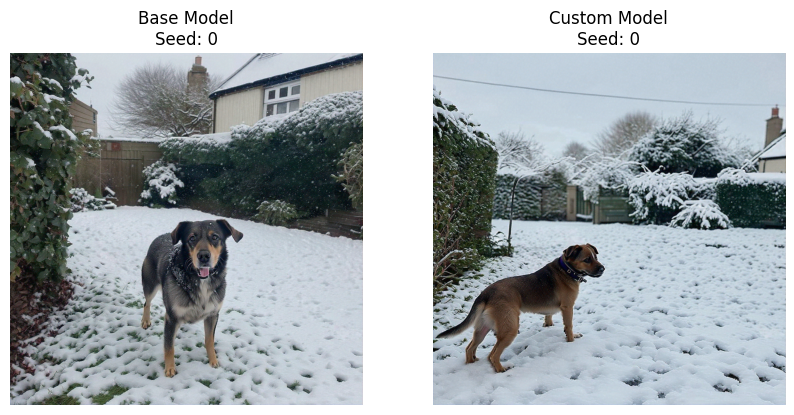

Prompt:'Ron the dog' in the snow.



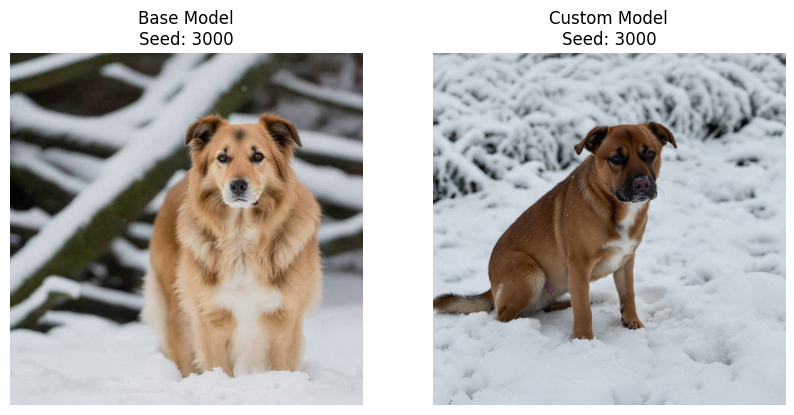

Prompt:'Smila the cat' in the snow.



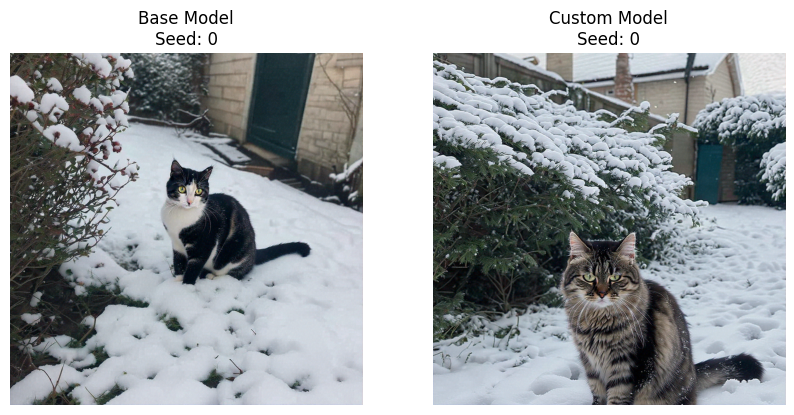

Prompt:'Smila the cat' in the snow.



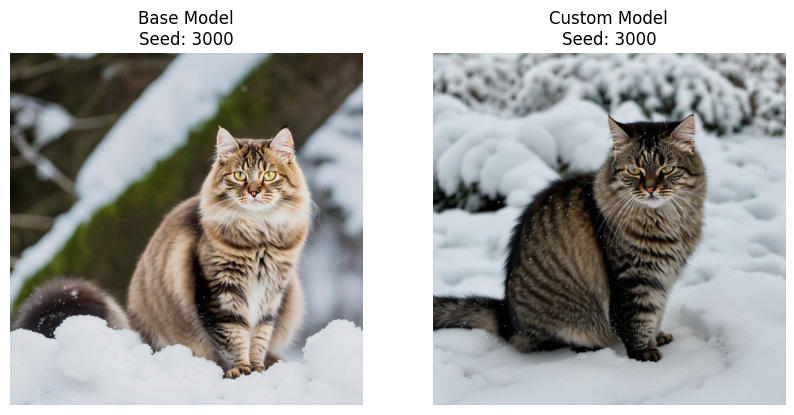

In [12]:
compare_models_outputs(prompts, seeds, "amazon.titan-image-generator-v1", provisioned_model_id)

In [21]:
prompts = [
    "'Ron the dog' on the moon.",
    "'Smila the cat' in black and white staring at the camera.",
]
seeds = [0, 3000]

Prompt:'Ron the dog' on the moon.



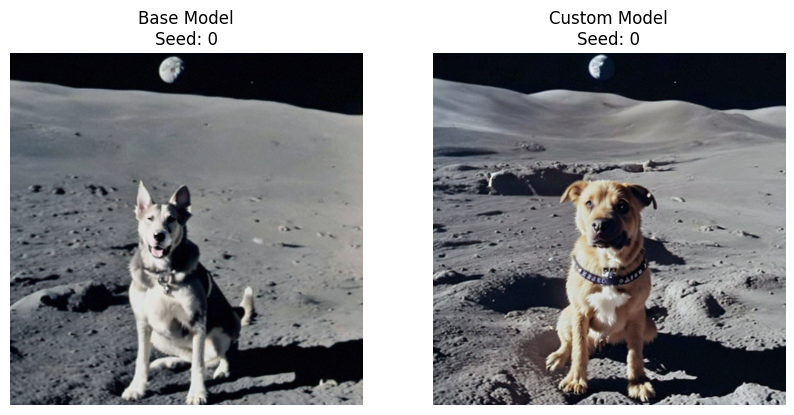

Prompt:'Ron the dog' on the moon.



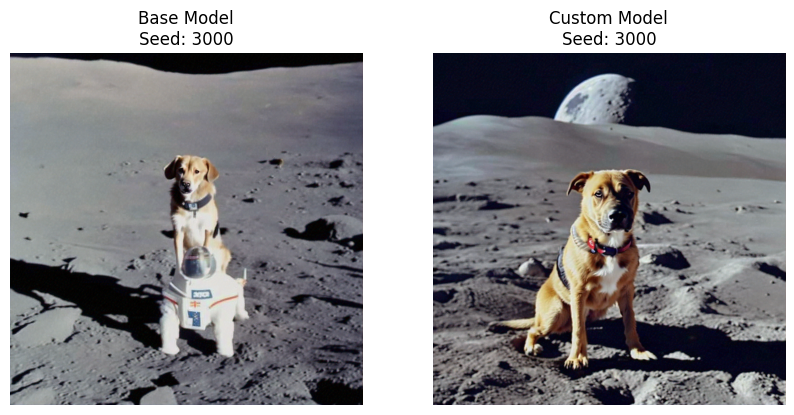

Prompt:'Smila the cat' in black and white staring at the camera.



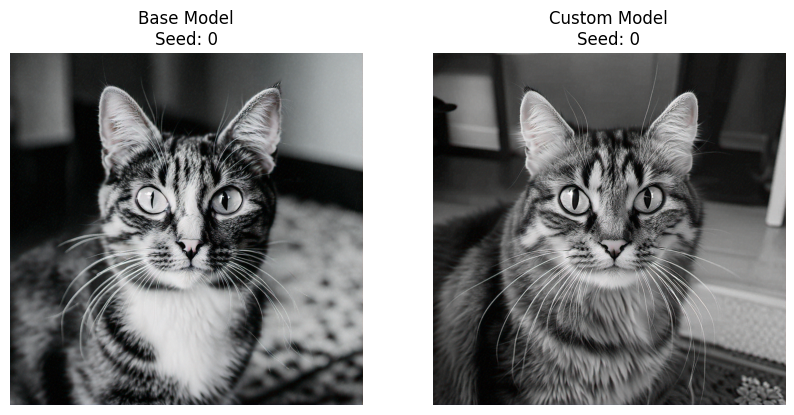

Prompt:'Smila the cat' in black and white staring at the camera.



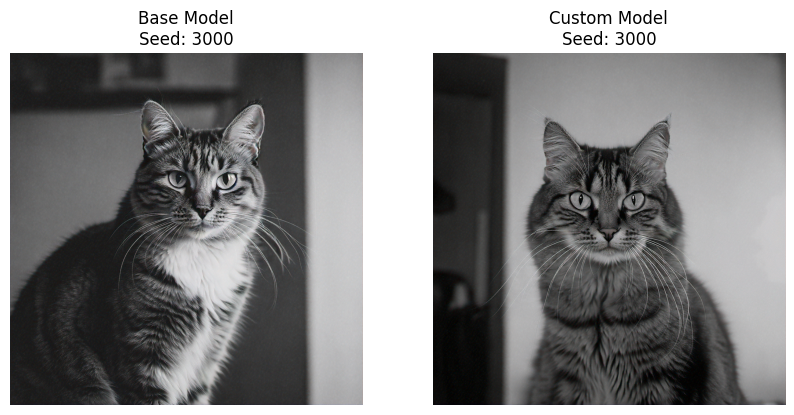

In [22]:
compare_models_outputs(prompts, seeds, "amazon.titan-image-generator-v1", provisioned_model_id)

In [33]:
prompts = [
    "'Ron the dog' is staring at the camera.",
    "'Smila the cat' is staring at the camera.",
]
seeds = [0, 3000]

Prompt:'Ron the dog' is staring at the camera.



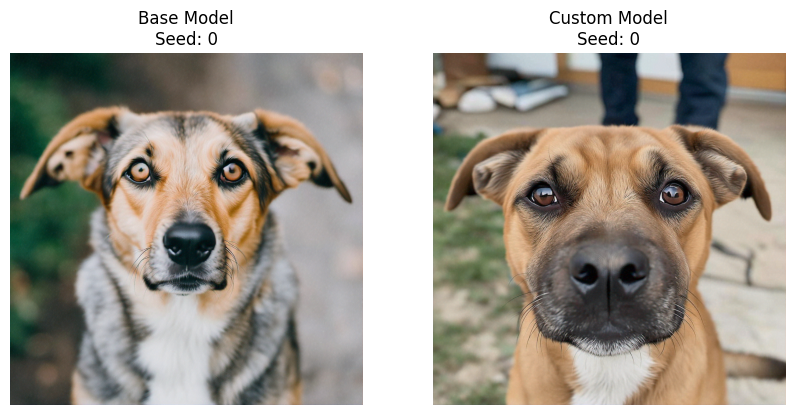

Prompt:'Ron the dog' is staring at the camera.



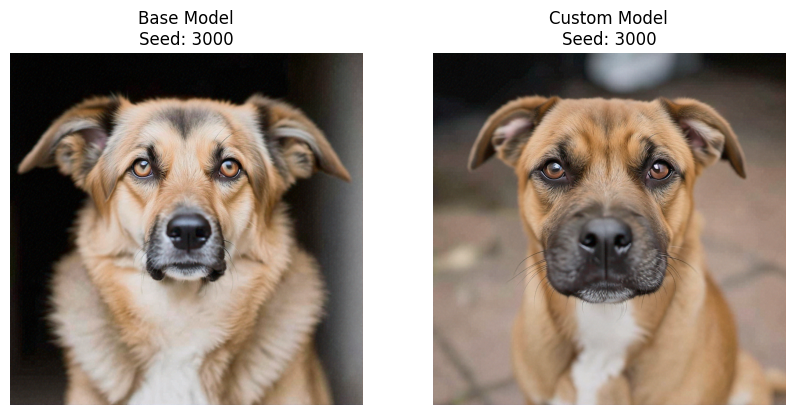

Prompt:'Smila the cat' is staring at the camera.



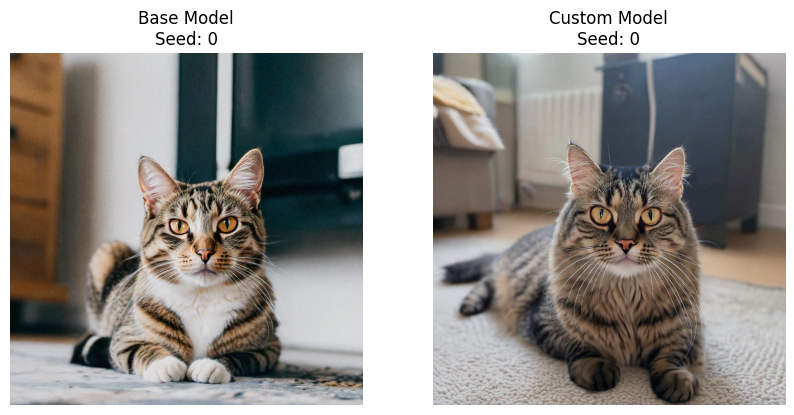

Prompt:'Smila the cat' is staring at the camera.



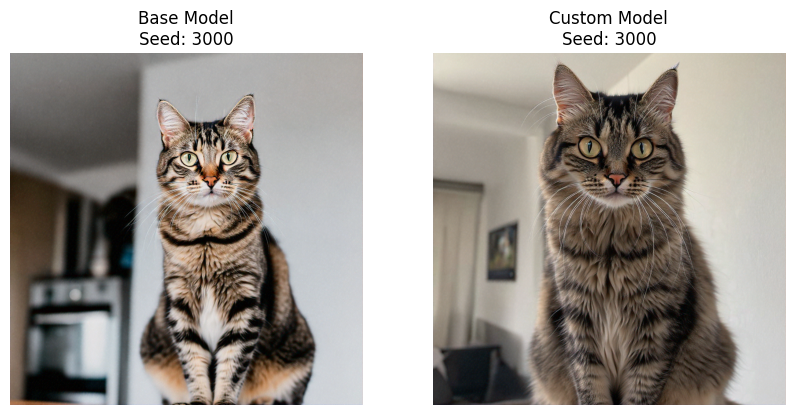

In [34]:
compare_models_outputs(prompts, seeds, "amazon.titan-image-generator-v1", provisioned_model_id)

In [35]:
prompts = [
    "'Ron the dog' is running on the beach.",
    "'Smila the cat' is running on the grass.",
]
seeds = [0, 3000]

Prompt:'Ron the dog' is running on the beach.



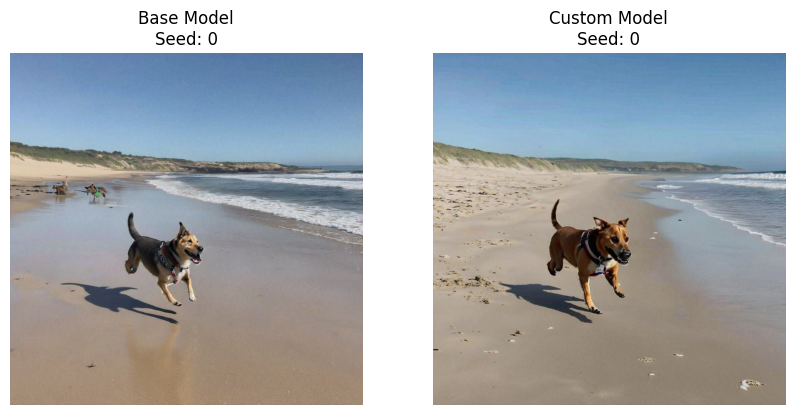

Prompt:'Ron the dog' is running on the beach.



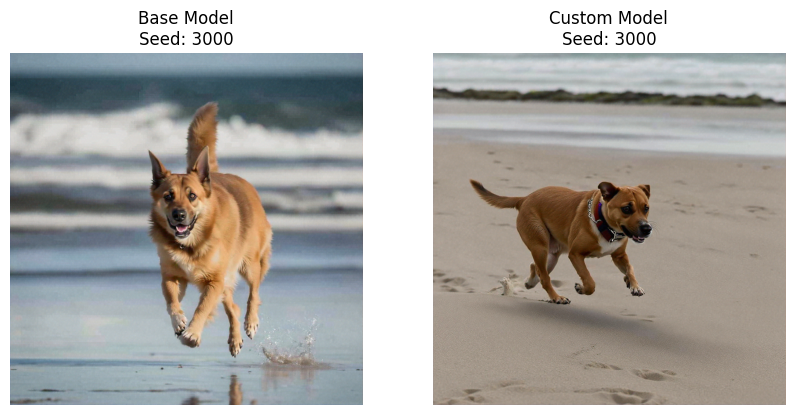

Prompt:'Smila the cat' is running on the grass.



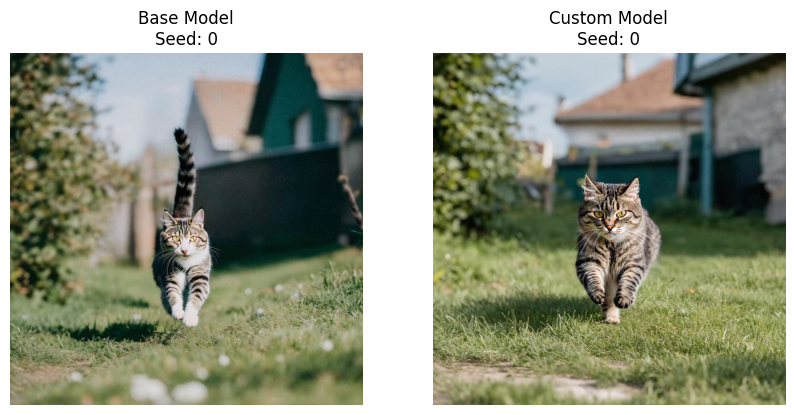

Prompt:'Smila the cat' is running on the grass.



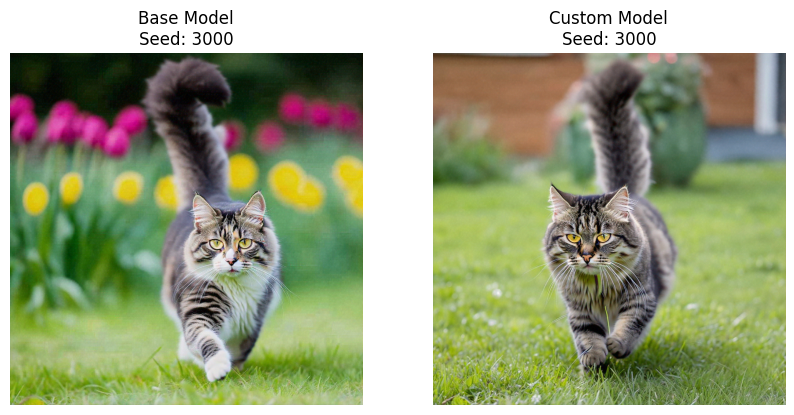

In [36]:
compare_models_outputs(prompts, seeds, "amazon.titan-image-generator-v1", provisioned_model_id)

## Clean Up

To avoid unnecessary costs, let's now delete the provisioned throughput model

In [37]:
response = bedrock.delete_provisioned_model_throughput(
    provisionedModelId=provisioned_model_id
)
response

{'ResponseMetadata': {'RequestId': 'c9c05de6-5f30-497a-aa8e-f70aacc0c2c4',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'date': 'Fri, 12 Jul 2024 18:26:51 GMT',
   'content-type': 'application/json',
   'content-length': '2',
   'connection': 'keep-alive',
   'x-amzn-requestid': 'c9c05de6-5f30-497a-aa8e-f70aacc0c2c4'},
  'RetryAttempts': 0}}